In [1]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN,SpectralClustering # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [2]:
np.random.seed(42)

In [3]:
cluster_generator = CorrelatedClusterGenerator(n_samples=100000,n_features=20,n_clusters=3,correlation=0.8,random_state=42,cluster_std=[1.0, 5.5, 0.5])

In [4]:
X, y, centers = cluster_generator.generate_clusters()

In [5]:
X = X + np.random.normal(scale=3,size=X.shape) 

In [6]:
X = np.vstack(
    (X[y == 0][:5000], X[y == 1][:3500], X[y == 2][:1500])
)  

In [7]:
y = [0] * 5000 + [1] * 3500 + [2] * 1500

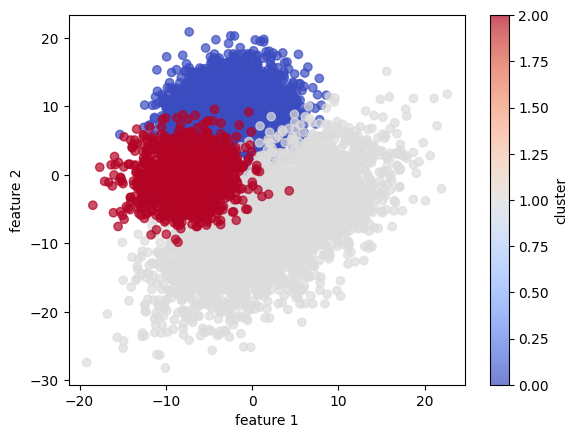

In [8]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

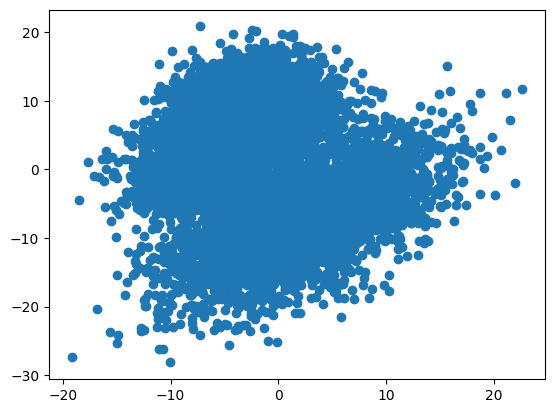

In [9]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [10]:
corr_dataset = pd.DataFrame(X) 

In [11]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [12]:
corr_dataset['target'] = y

In [13]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,-4.758285,7.191290,2.604174,-1.378545,-7.579009,-5.924052,-11.465204,5.599387,4.312371,1.480616,...,6.554043,10.174477,-6.105382,-8.598853,-3.905392,-3.932896,0.909880,-2.713525,-0.151418,0
1,-0.732528,5.919045,3.395496,-4.316339,-9.314733,-14.688826,-11.158299,11.006670,7.445052,-2.340694,...,4.905409,3.373192,-5.587315,-6.025893,-7.078251,-4.352729,-4.126285,2.608812,-2.844389,0
2,-1.795706,11.580210,8.780512,-2.139190,-4.376991,-8.778926,-12.409837,6.130500,1.658990,0.508636,...,9.949368,0.902826,-4.443581,-6.327451,-6.681295,-4.509145,1.470753,0.827407,-7.060880,0
3,-1.974161,9.332624,2.333523,0.861848,-2.321023,-6.625579,-7.851833,7.562466,1.066909,1.931852,...,10.462449,8.358172,-8.215578,-7.137352,-6.076082,-4.456453,1.647711,3.676725,-1.000291,0
4,-3.391887,10.610474,0.030521,2.059035,-6.567614,-7.788718,-12.629633,7.802215,1.641294,6.181642,...,9.098878,2.426418,-4.289523,-5.832111,-6.975442,-1.563299,-1.079437,3.909238,-4.513158,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251138,1.740250,-3.210057,9.776245,-4.421000,5.869836,-3.530181,7.629912,-0.605109,-7.384417,...,2.027149,11.944160,2.384789,4.995102,9.154057,-11.648487,-4.730116,-9.753854,-3.866760,2
9996,-4.336823,2.497470,-12.587610,7.245861,-8.598974,2.776159,-3.267317,4.936419,3.260930,-1.862289,...,9.838348,9.865637,11.380138,0.367788,11.277025,-7.428380,-5.164451,-11.328021,-3.286570,2
9997,-5.083178,-3.989330,-8.971196,10.524717,-5.104191,4.557569,-4.556897,0.071808,-1.715378,-9.215473,...,4.241917,7.254749,4.476105,1.909178,12.341801,-5.159205,-8.570069,-6.478428,-0.311540,2
9998,-11.756202,-0.744430,-10.834891,6.885746,-3.145970,3.945857,-3.624172,2.300592,0.784533,-5.578495,...,5.820646,3.193405,3.735165,3.981023,12.958702,-10.167621,-6.177847,-10.109130,-4.251650,2


In [14]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [15]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.106531,0.233029,-0.119204,0.510955,0.398535,0.278345,0.162969,0.363288,-0.001036,0.150455,-0.205561,-0.291729,0.338830,0.474263,0.261131,0.476497,0.078234,0.660957,0.463137
vab_2,-0.106531,1.000000,0.682143,0.447135,-0.260897,-0.534862,-0.040196,0.679320,0.265999,0.815790,-0.463586,0.825982,0.754243,-0.581894,-0.605750,-0.522008,0.246146,0.737381,-0.092020,-0.019811
vab_3,0.233029,0.682143,1.000000,0.157250,-0.054534,-0.396155,-0.051293,0.666690,0.342269,0.725222,-0.514497,0.565951,0.413953,-0.472768,-0.377930,-0.486277,0.427374,0.665431,0.284192,0.124646
vab_4,-0.119204,0.447135,0.157250,1.000000,0.053435,0.038771,0.358745,0.348233,0.313846,0.363152,0.242632,0.552388,0.638672,0.042361,-0.098419,0.140877,0.154275,0.390219,-0.198448,0.186983
vab_5,0.510955,-0.260897,-0.054534,0.053435,1.000000,0.612613,0.465661,-0.011645,0.348576,-0.199549,0.503266,-0.272141,-0.254915,0.600036,0.647313,0.558664,0.361482,-0.085196,0.492055,0.504677
vab_6,0.398535,-0.534862,-0.396155,0.038771,0.612613,1.000000,0.512066,-0.284487,0.209601,-0.496625,0.751631,-0.481241,-0.389068,0.814980,0.802314,0.789550,0.176445,-0.351991,0.334509,0.461124
vab_7,0.278345,-0.040196,-0.051293,0.358745,0.465661,0.512066,1.000000,0.097064,0.368244,-0.046956,0.543663,0.016776,0.089358,0.507298,0.462547,0.537350,0.293697,0.060454,0.225903,0.447076
vab_8,0.162969,0.679320,0.666690,0.348233,-0.011645,-0.284487,0.097064,1.000000,0.377290,0.697074,-0.314757,0.624415,0.537299,-0.345663,-0.312475,-0.321824,0.404748,0.656772,0.173902,0.185050
vab_9,0.363288,0.265999,0.342269,0.313846,0.348576,0.209601,0.368244,0.377290,1.000000,0.298667,0.156727,0.248901,0.218666,0.172497,0.197026,0.178331,0.443122,0.353397,0.350962,0.411409
vab_10,-0.001036,0.815790,0.725222,0.363152,-0.199549,-0.496625,-0.046956,0.697074,0.298667,1.000000,-0.486075,0.765281,0.664559,-0.552175,-0.542108,-0.513045,0.317096,0.730838,0.022143,0.029873


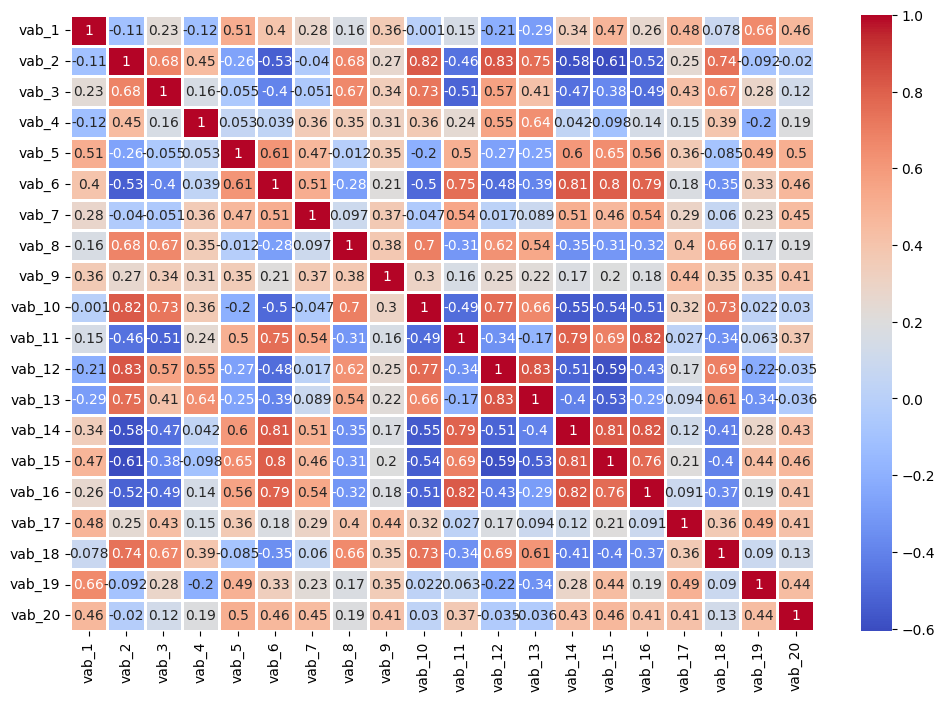

In [16]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [17]:
X_values = corr_dataset.iloc[:,:-1].values

In [18]:
y_values = corr_dataset.iloc[:,-1].values

In [19]:
scaler = StandardScaler()

In [20]:
X_values = scaler.fit_transform(X_values)

In [21]:
np.mean(X_values),np.std(X_values)

(-7.460343454113172e-16, 1.0)

In [22]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.570717,0.607233,0.451045,-0.453966,-0.596323,-0.672746,-0.907338,0.322024,0.583808,0.463646,-0.928370,0.388713,0.969083,-0.886975,-1.064974,-0.513369,0.125807,0.736333,-0.324953,0.624982
1,0.157233,0.460217,0.563736,-0.964069,-0.927867,-1.855082,-0.843524,1.271803,1.288652,-0.033980,-0.996715,0.194999,0.202357,-0.825849,-0.759400,-0.911286,0.036019,-0.109415,0.549704,0.050360
2,-0.035014,1.114399,1.330611,-0.586041,0.015299,-1.057858,-1.103753,0.415313,-0.013194,0.337071,-1.159388,0.787662,-0.076134,-0.690901,-0.795214,-0.861503,0.002566,0.830523,0.256954,-0.849348
3,-0.067283,0.854677,0.412502,-0.064956,0.408012,-0.767380,-0.156019,0.666835,-0.146411,0.522408,-0.412218,0.847949,0.764327,-1.135954,-0.891401,-0.785601,0.013835,0.860241,0.725202,0.443851
4,-0.323641,1.002340,0.084534,0.142917,-0.403135,-0.924283,-1.149454,0.708947,-0.017176,1.075832,-0.870587,0.687730,0.095624,-0.672724,-0.736386,-0.898393,0.632587,0.402257,0.763413,-0.305719
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-0.117367,-0.022668,-0.376953,1.482892,0.006893,0.918206,0.742571,0.678682,-0.522610,-0.690793,1.458853,-0.143195,1.168585,0.114769,0.549492,1.124453,-1.524306,-0.210820,-1.481939,-0.167792
9996,-0.494507,0.064833,-1.712400,1.043530,-0.791148,0.500880,0.797227,0.205575,0.347237,0.028320,1.695375,0.774617,0.934267,1.176118,-0.000064,1.390701,-0.621763,-0.283760,-1.740633,-0.043992
9997,-0.629465,-0.684756,-1.197390,1.612852,-0.123605,0.741186,0.529088,-0.648886,-0.772417,-0.929240,1.619370,0.117039,0.639935,0.361520,0.182997,1.524237,-0.136460,-0.855682,-0.943666,0.590816
9998,-1.836103,-0.309788,-1.462797,0.981001,0.250438,0.658668,0.723027,-0.257404,-0.209944,-0.455618,1.644061,0.302539,0.182089,0.274098,0.429056,1.601605,-1.207597,-0.453945,-1.540324,-0.249919


<Axes: ylabel='Density'>

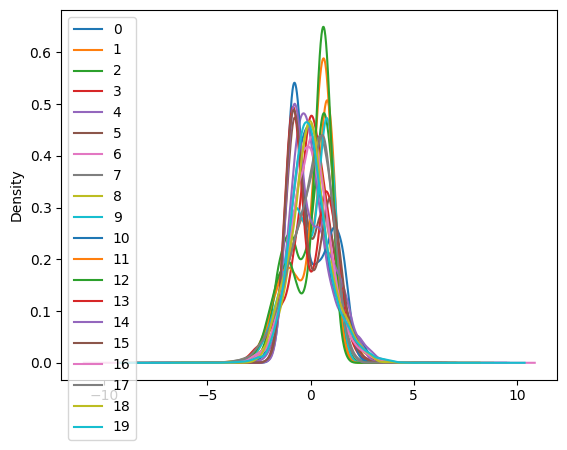

In [23]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [24]:
pca_general = PCA()

In [25]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [26]:
explained_variance = pca_general.explained_variance_ratio_

In [27]:
explained_variance

array([0.39272334, 0.24265014, 0.115197  , 0.02717444, 0.02554969,
       0.02315011, 0.02173731, 0.01942932, 0.01724758, 0.01621673,
       0.01561151, 0.01289714, 0.01186043, 0.00981098, 0.00955192,
       0.00864003, 0.00787653, 0.00779604, 0.0075509 , 0.00732885])

In [28]:
eigenvalues = pca_general.explained_variance_

In [29]:
pd.DataFrame(eigenvalues)

,0
0,7.855252
1,4.853488
2,2.304170
3,0.543543
4,0.511045
5,0.463048
6,0.434790
7,0.388625
8,0.344986
9,0.324367


In [30]:
eigenvectors = pca_general.components_

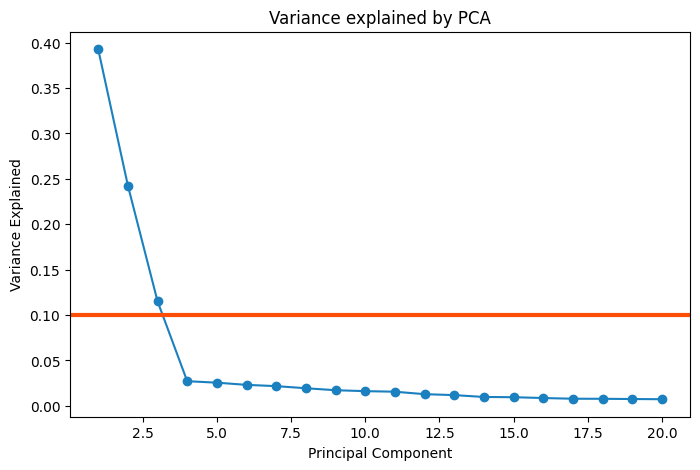

In [31]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [32]:
pca = PCA(n_components=3)

In [33]:
principal_components = pca.fit_transform(X_values)

In [34]:
pd.DataFrame(principal_components).head(8)

,0,1,2
0,-2.436930,-0.109361,-0.312205
1,-2.304208,-0.237447,-1.684003
2,-2.711703,-0.289761,-1.440857
3,-2.277486,0.706221,-0.510448
4,-2.528735,0.056383,-0.944621
5,-2.571626,0.374532,0.362670
6,-2.508819,0.085332,-0.338139
7,-2.451890,-0.105913,-0.390083


In [35]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3'])

In [36]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [37]:
final_df

,principal component 1,principal component 2,principal component 3,target
0,-2.436930,-0.109361,-0.312205,0
1,-2.304208,-0.237447,-1.684003,0
2,-2.711703,-0.289761,-1.440857,0
3,-2.277486,0.706221,-0.510448,0
4,-2.528735,0.056383,-0.944621,0
...,...,...,...,...
9995,0.929431,0.025363,3.037095,2
9996,0.906602,0.076651,3.657792,2
9997,1.950707,-0.293956,2.979099,2
9998,1.570205,-0.878484,3.544565,2


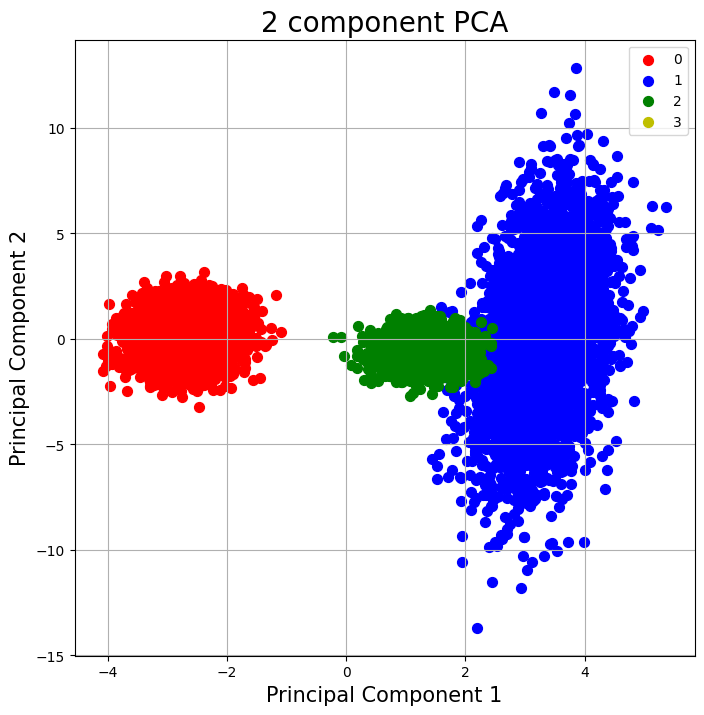

In [38]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

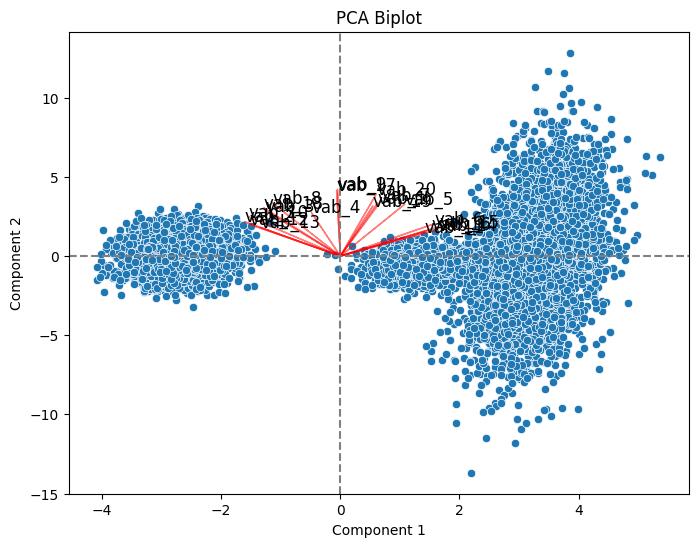

In [39]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

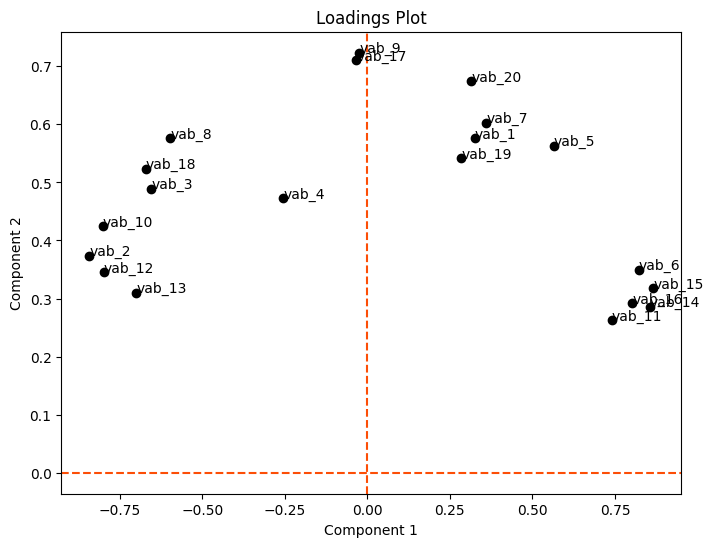

In [40]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [41]:
X_pca = pca.transform(X_values)

In [42]:
pd.DataFrame(X_pca).head()

,0,1,2
0,-2.436930,-0.109361,-0.312205
1,-2.304208,-0.237447,-1.684003
2,-2.711703,-0.289761,-1.440857
3,-2.277486,0.706221,-0.510448
4,-2.528735,0.056383,-0.944621


## t-SNE

In [43]:
tsne = TSNE(n_components=3,random_state=42)

In [ ]:
X_tsne = tsne.fit_transform(X_values)

In [ ]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-20.885881,21.541998,-0.009848,0
1,-11.201618,28.735392,-0.468571,0
2,-21.730072,-14.005232,16.423405,0
3,-9.961735,0.573931,-19.488894,0
4,-11.064446,-10.664109,-0.696010,0
...,...,...,...,...
9995,-3.256805,0.185128,24.528460,2
9996,24.404339,-7.671815,23.441742,2
9997,17.775311,7.248422,29.323004,2
9998,9.063418,-6.661641,27.087227,2


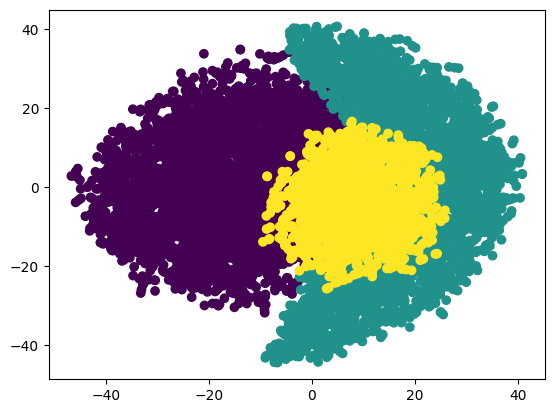

In [ ]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [ ]:
tsne.kl_divergence_

2.7153451442718506

## umap

In [ ]:
umap = umap.UMAP(n_components=3,random_state=42)

In [ ]:
X_umap = umap.fit_transform(X_values)

c:\Users\adepa\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
umap_data

,dim_1,dim_2,dim_3,target
0,13.354739,4.996101,5.507828,0
1,13.968423,5.535153,5.325309,0
2,13.471560,6.320584,6.574710,0
3,14.026503,4.244301,6.339931,0
4,13.575001,5.370247,7.079820,0
...,...,...,...,...
9995,-11.606724,4.280283,0.994086,2
9996,-12.125772,4.578565,1.338212,2
9997,-12.539476,4.180383,0.666656,2
9998,-11.784538,3.996714,1.200312,2


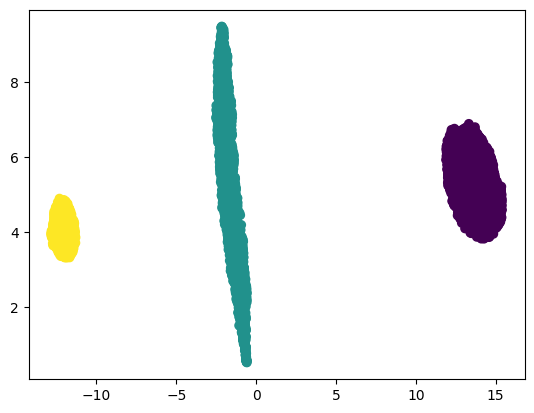

In [ ]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [ ]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_kmeans = corr_dataset.copy()

In [ ]:
df_kmeans['k_means'] = kmeans.labels_

In [ ]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,2
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,2
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,2
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.1728
accuracy after: 0.8272


In [ ]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


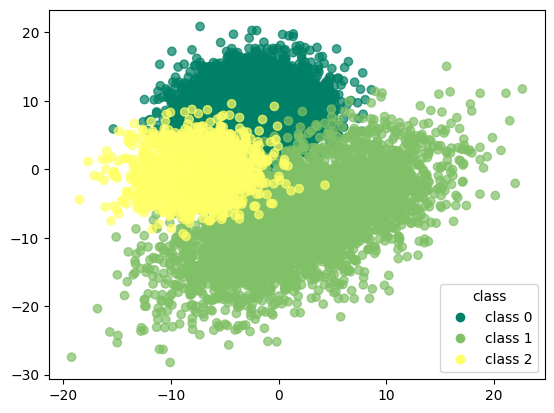

In [ ]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

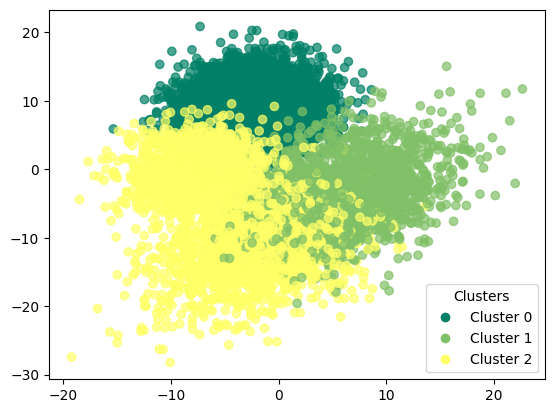

In [ ]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
kmeans.cluster_centers_

array([[ 1.39977818, -0.61937568,  0.03044101, -0.04408056,  1.45813171,
         1.40813301,  1.03508373,  0.0480388 ,  0.8608302 , -0.42195009,
         1.0079953 , -0.71298905, -0.74477572,  1.34305359,  1.52145596,
         1.20765515,  1.00318061, -0.14059676,  1.37392024,  1.25517917],
       [-0.52149226, -0.92233661, -1.15870529, -0.1713653 , -0.07025985,
         0.45496893, -0.0046687 , -0.9798474 , -0.58683284, -1.01629898,
         0.69480093, -0.72626858, -0.48464048,  0.57848773,  0.40439342,
         0.61778515, -0.75660825, -0.95501793, -0.60309095, -0.31543465],
       [-0.15825322,  0.81514904,  0.73798533,  0.12633196, -0.47048508,
        -0.79219838, -0.36319571,  0.61618126,  0.07464966,  0.80601834,
        -0.8056091 ,  0.72157028,  0.57667633, -0.84899113, -0.79961015,
        -0.82648115,  0.13399495,  0.66687572, -0.09637561, -0.24024852]])

In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[5000    0    0]
 [   0 1772 1728]
 [   0    0 1500]]


In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      0.51      0.67      3500
           2       0.46      1.00      0.63      1500

    accuracy                           0.83     10000
   macro avg       0.82      0.84      0.77     10000
weighted avg       0.92      0.83      0.83     10000



### k-means with pca

In [ ]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_pca_kmeans = corr_dataset.copy()

In [ ]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [ ]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,2
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,2
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.6046
accuracy after: 0.6046


In [ ]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,2
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,2
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


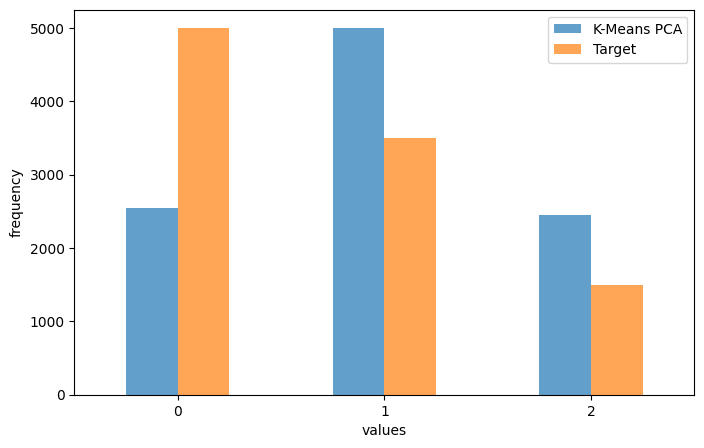

In [ ]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2546    0 2454]
 [   0 3500    0]
 [   0 1500    0]]


In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.67      5000
           1       0.70      1.00      0.82      3500
           2       0.00      0.00      0.00      1500

    accuracy                           0.60     10000
   macro avg       0.57      0.50      0.50     10000
weighted avg       0.74      0.60      0.63     10000



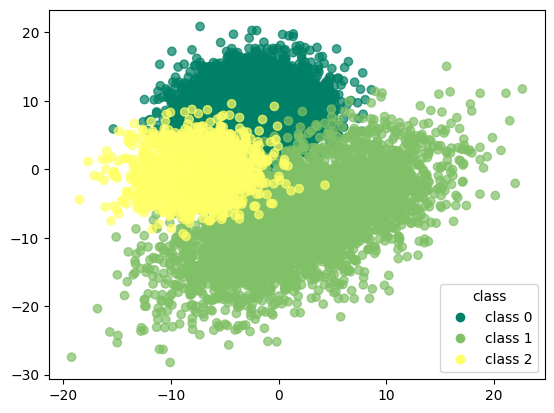

In [ ]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

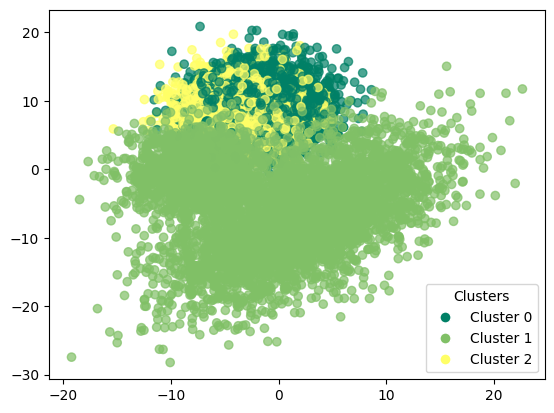

In [ ]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

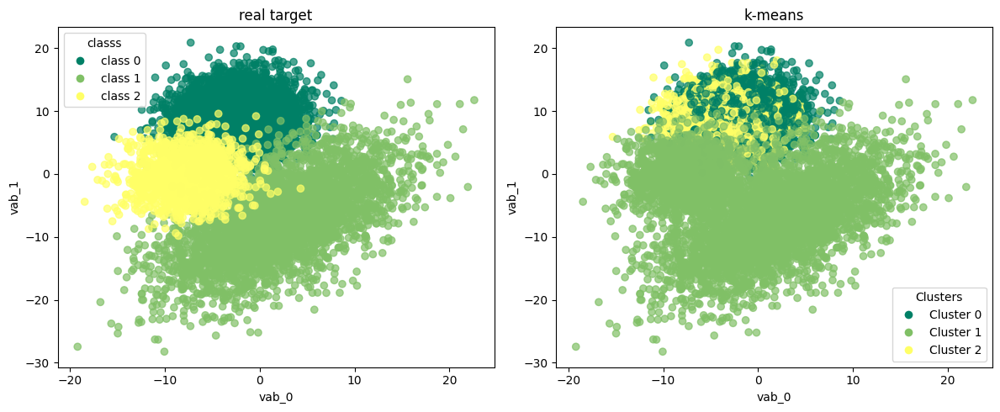

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

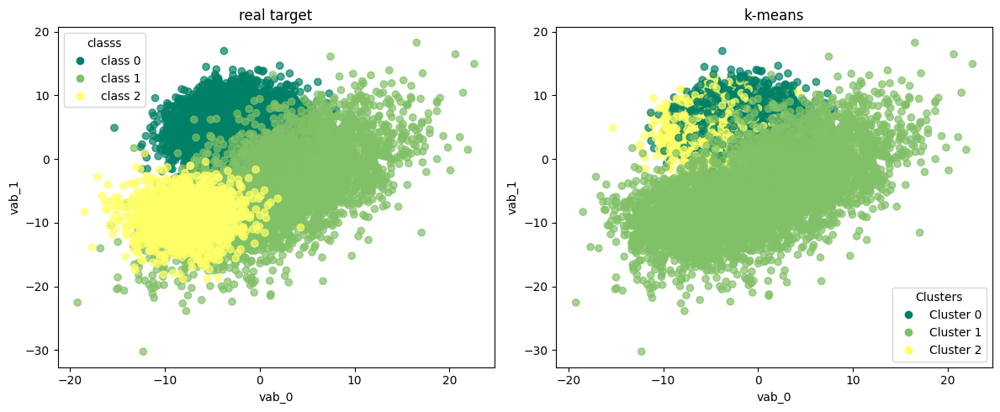

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

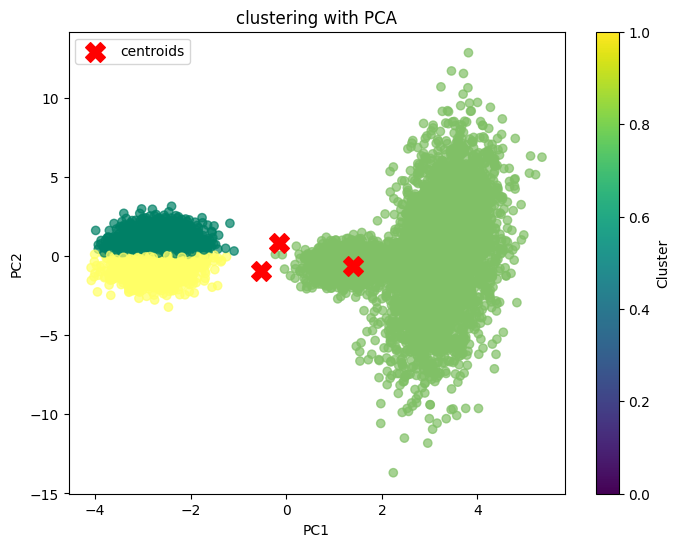

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

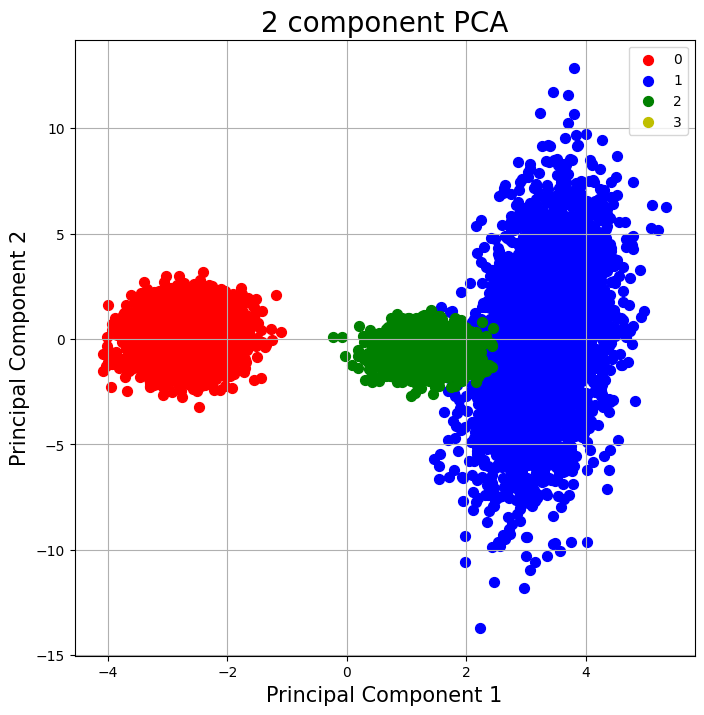

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [ ]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_tsne_kmeans = corr_dataset.copy()

In [ ]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [ ]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,2
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,2
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.2528
accuracy after: 0.7004


In [ ]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,1
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


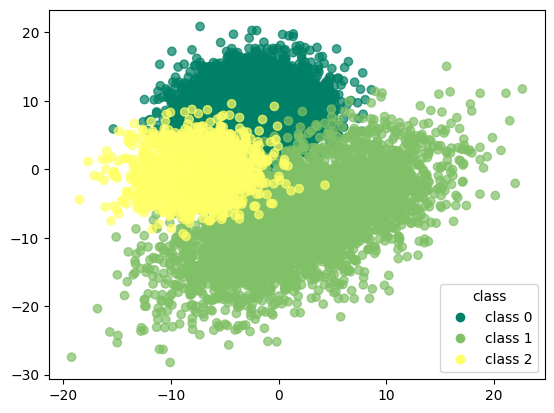

In [ ]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

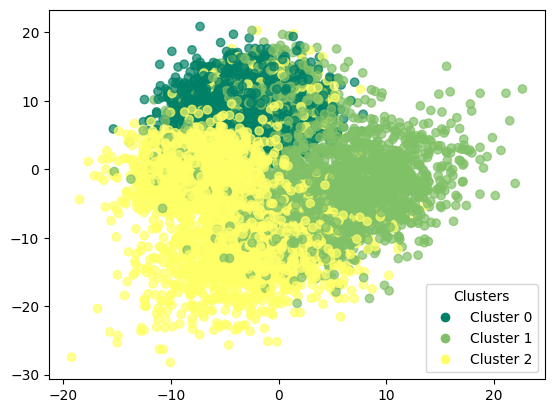

In [ ]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

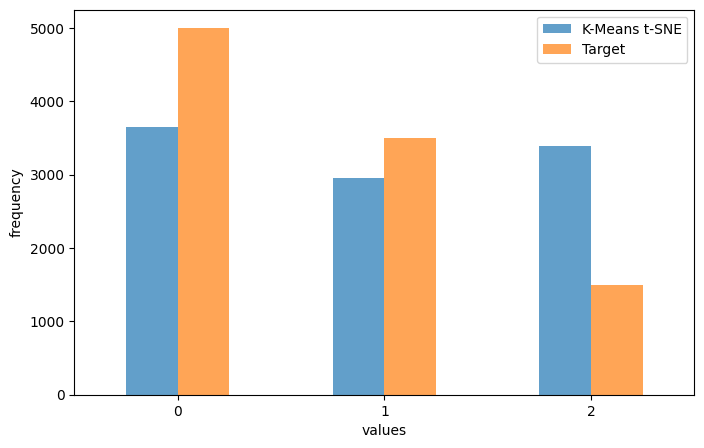

In [ ]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[3651  954  395]
 [   0 1926 1574]
 [   0   73 1427]]


In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.73      0.84      5000
           1       0.65      0.55      0.60      3500
           2       0.42      0.95      0.58      1500

    accuracy                           0.70     10000
   macro avg       0.69      0.74      0.67     10000
weighted avg       0.79      0.70      0.72     10000



### k-means with umap

In [ ]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_umap_kmeans = corr_dataset.copy()

In [ ]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [ ]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.5
accuracy after: 1.0


In [ ]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


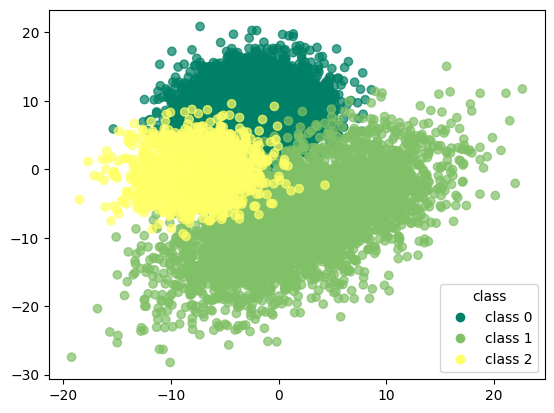

In [ ]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

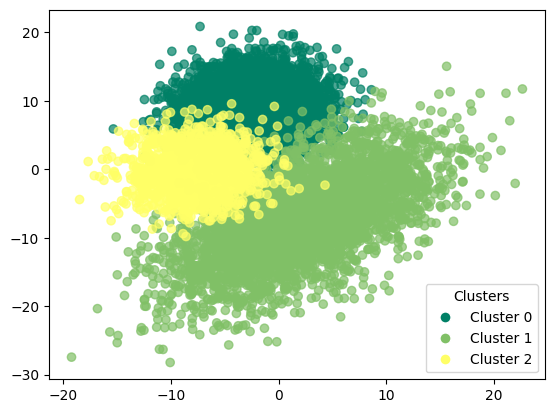

In [ ]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

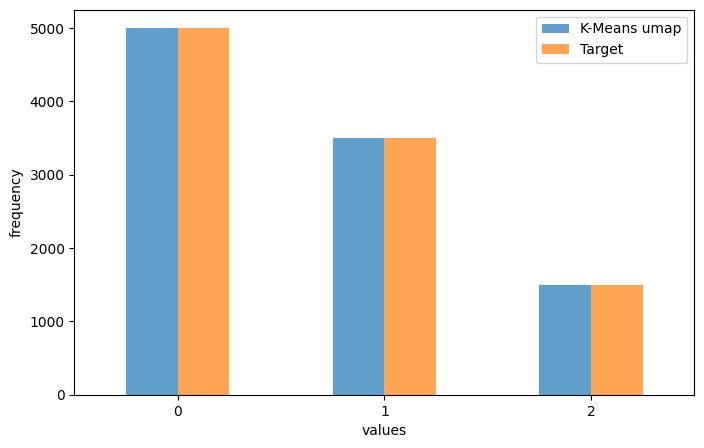

In [ ]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[5000    0    0]
 [   0 3500    0]
 [   0    0 1500]]


In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      1.00      1.00      3500
           2       1.00      1.00      1.00      1500

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## trimmed k-means

In [ ]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [ ]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [ ]:
trimmed_kmeans

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_trim_kmeans = corr_dataset.copy()

In [ ]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [ ]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [ ]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,2
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,2
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,2
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,0
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,0
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,0
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,0


In [ ]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.29555555555555557
accuracy after: 0.9995555555555555


In [ ]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


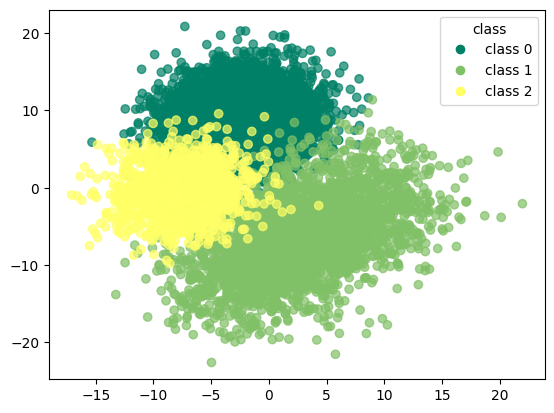

In [ ]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

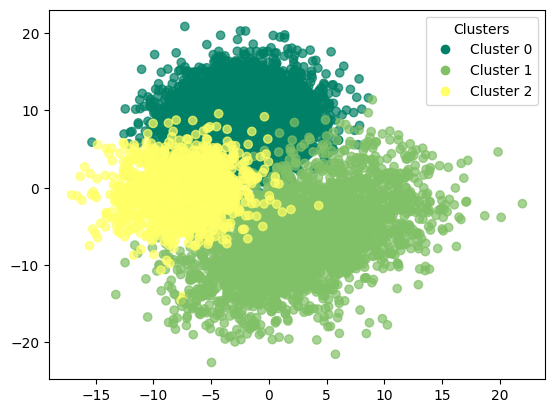

In [ ]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[5000    0    0]
 [   0 2660    4]
 [   0    0 1336]]


In [ ]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      1.00      1.00      2664
           2       1.00      1.00      1.00      1336

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000



### trimmed k-means with pca

In [ ]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [ ]:
trim_kmeans_pca

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_pca_trim_kmeans = corr_dataset.copy()

In [ ]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [ ]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [ ]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


In [ ]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.9866666666666667
accuracy after: 0.9866666666666667


In [ ]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


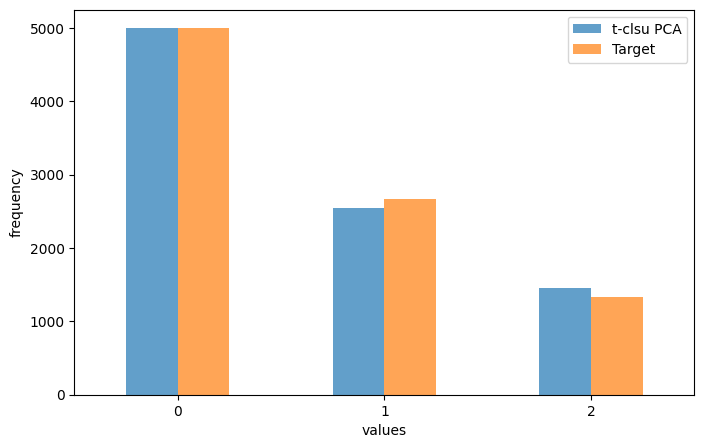

In [ ]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [ ]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[5000    0    0]
 [   0 2544  120]
 [   0    0 1336]]


In [ ]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      0.95      0.98      2664
           2       0.92      1.00      0.96      1336

    accuracy                           0.99      9000
   macro avg       0.97      0.98      0.98      9000
weighted avg       0.99      0.99      0.99      9000



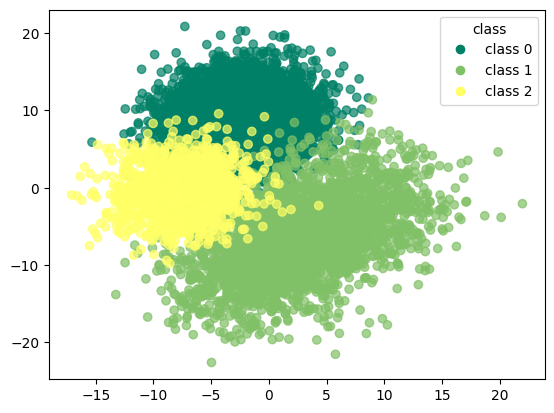

In [ ]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

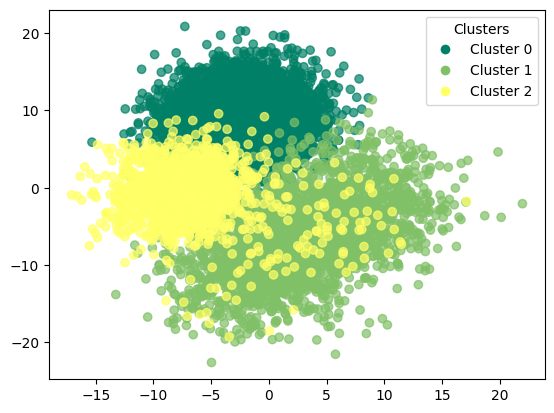

In [ ]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

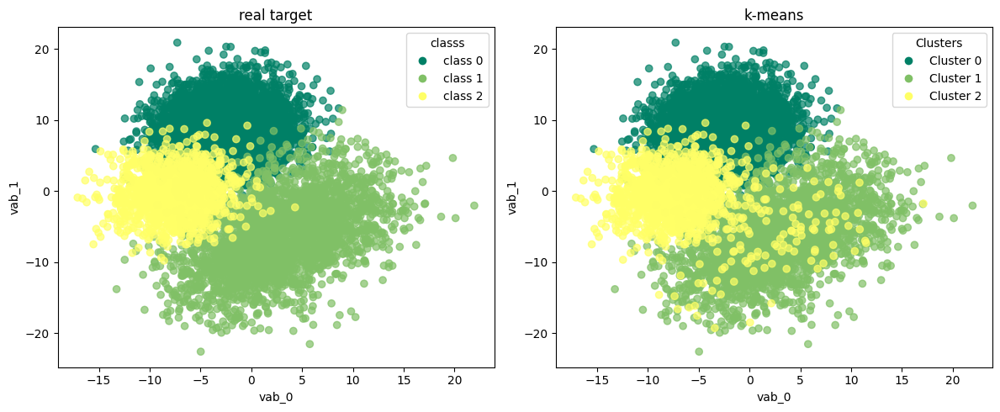

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

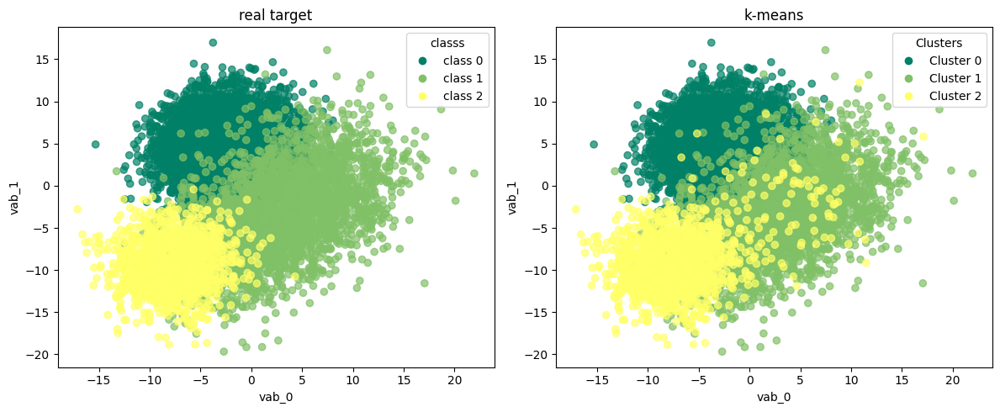

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [ ]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [ ]:
trim_kmeans_tsne

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [ ]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [ ]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [ ]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


In [ ]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.6852222222222222
accuracy after: 0.6852222222222222


In [ ]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


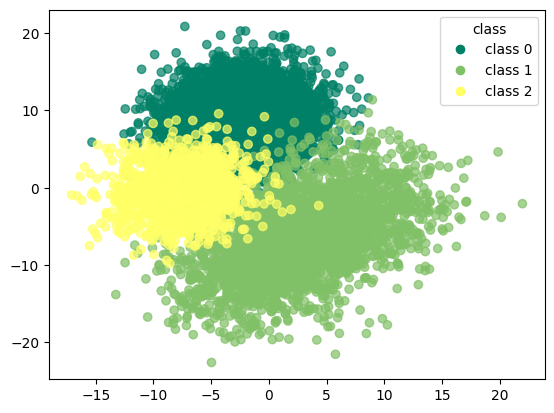

In [ ]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

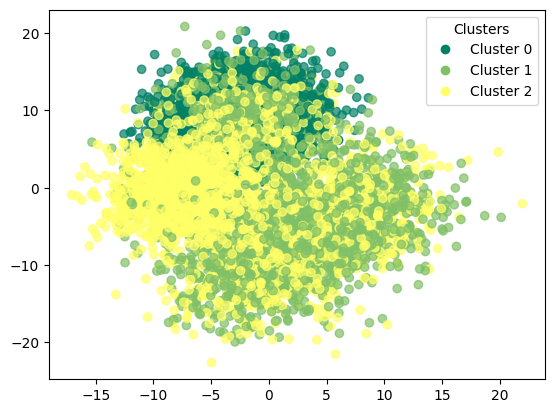

In [ ]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

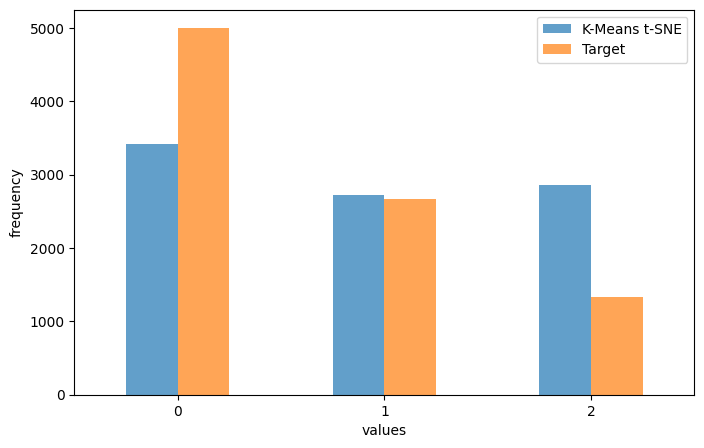

In [ ]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[3413 1044  543]
 [   0 1548 1116]
 [   0  130 1206]]


In [ ]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.68      0.81      5000
           1       0.57      0.58      0.57      2664
           2       0.42      0.90      0.57      1336

    accuracy                           0.69      9000
   macro avg       0.66      0.72      0.65      9000
weighted avg       0.79      0.69      0.71      9000



### trimmed k-means with umap

In [ ]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [ ]:
trim_kmeans_umap

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_umap_trim_kmeans = corr_dataset.copy()

In [ ]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [ ]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [ ]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.5555555555555556
accuracy after: 1.0


In [ ]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


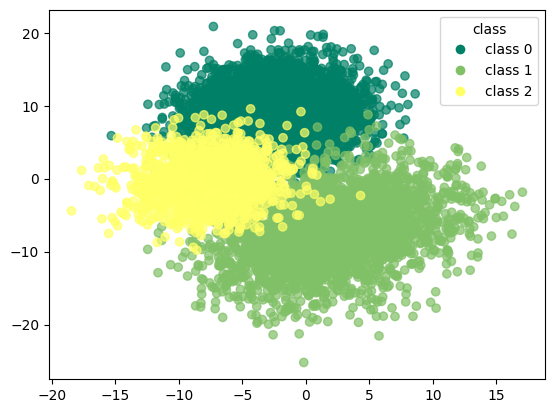

In [ ]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

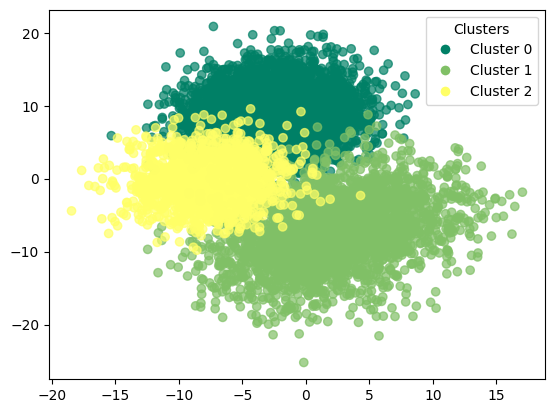

In [ ]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

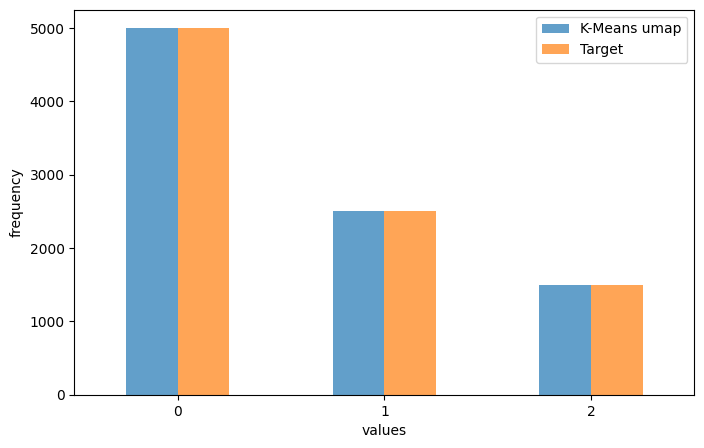

In [ ]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[5000    0    0]
 [   0 2500    0]
 [   0    0 1500]]


In [ ]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      1.00      1.00      2500
           2       1.00      1.00      1.00      1500

    accuracy                           1.00      9000
   macro avg       1.00      1.00      1.00      9000
weighted avg       1.00      1.00      1.00      9000



## dbscan

In [ ]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

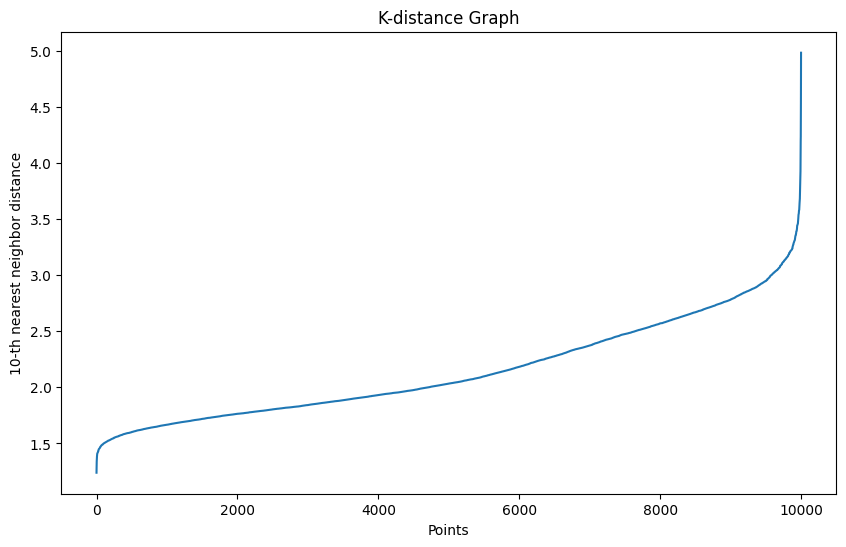

In [ ]:
plot_k_distance_graph(X_values,k=10) 

In [ ]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [ ]:
dbscan.fit(X_values)

,eps,0.9
,min_samples,10
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [ ]:
df_dbscan = corr_dataset.copy()

In [ ]:
df_dbscan['dbscan'] = dbscan.labels_

In [ ]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [ ]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,-1
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,-1
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,-1
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,-1
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,-1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,-1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,-1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,-1


In [ ]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    10000
Name: count, dtype: int64


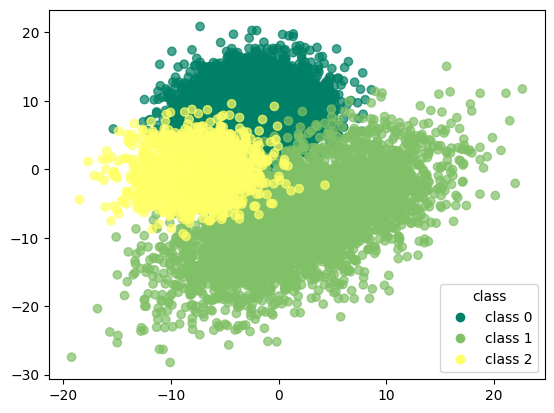

In [ ]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

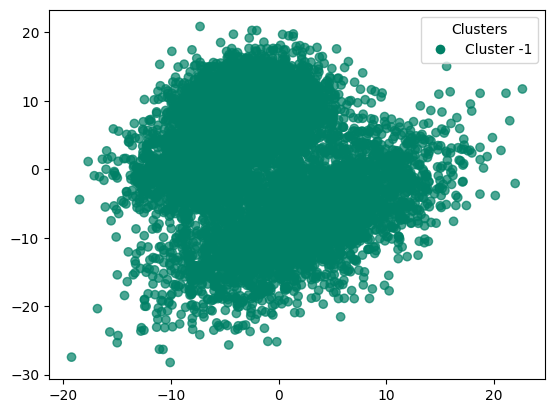

In [ ]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [5000    0    0    0]
 [3500    0    0    0]
 [1500    0    0    0]]


In [ ]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    5000.0
           1       0.00      0.00      0.00    3500.0
           2       0.00      0.00      0.00    1500.0

    accuracy                           0.00   10000.0
   macro avg       0.00      0.00      0.00   10000.0
weighted avg       0.00      0.00      0.00   10000.0



### dbscan with pca

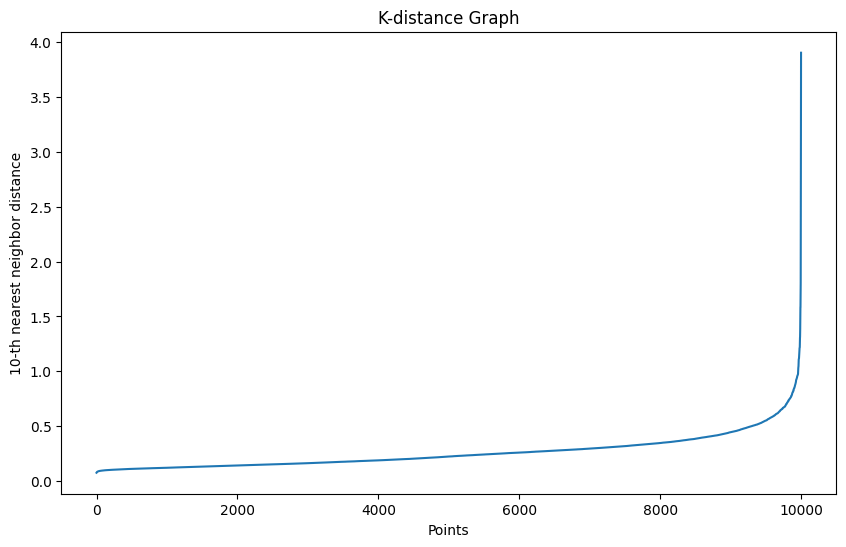

In [ ]:
plot_k_distance_graph(X_pca,k=10)

In [ ]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [ ]:
dbscan_pca.fit(X_pca)

,eps,0.4
,min_samples,10
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [ ]:
df_pca_dbscan = corr_dataset.copy()

In [ ]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [ ]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.7885
accuracy after: 0.7885


In [ ]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,4
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,4
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,4
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,4


In [ ]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 0    4945
 1    2940
 4    1467
-1     629
 2      19
Name: count, dtype: int64


In [ ]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0    0]
 [  55 4945    0    0    0]
 [ 541    0 2940   19    0]
 [  33    0    0    0 1467]
 [   0    0    0    0    0]]


In [ ]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.99      0.99      5000
           1       1.00      0.84      0.91      3500
           2       0.00      0.00      0.00      1500
           4       0.00      0.00      0.00         0

    accuracy                           0.79     10000
   macro avg       0.40      0.37      0.38     10000
weighted avg       0.85      0.79      0.82     10000



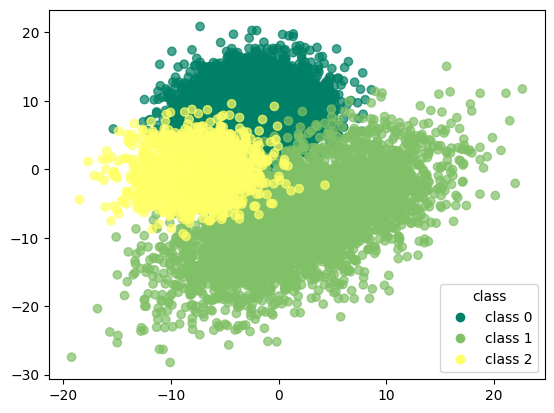

In [ ]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

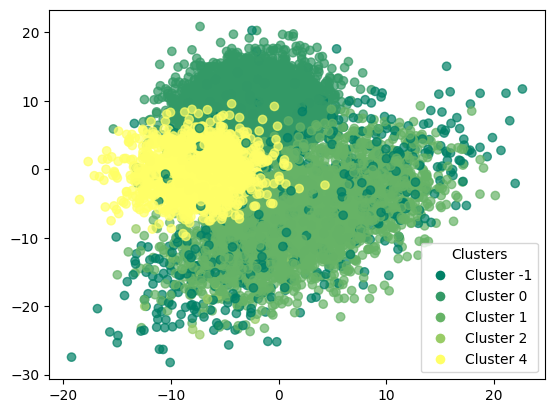

In [ ]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

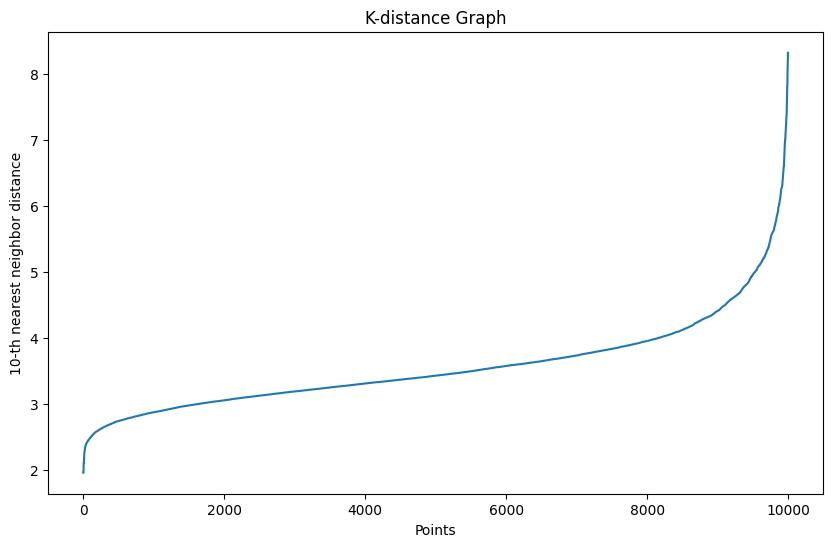

In [ ]:
plot_k_distance_graph(X_tsne,k=10)

In [ ]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [ ]:
dbscan_tsne.fit(X_tsne)

,eps,3
,min_samples,10
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [ ]:
df_tsne_dbscan = corr_dataset.copy()

In [ ]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [ ]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.0014
accuracy after: 0.0035


In [ ]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,1
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,-1
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,-1
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,-1
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,146
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,-1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,153
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,140


In [ ]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
-1      5052
 94      765
 2       605
 140     547
 8       104
        ... 
 84        7
 152       6
 121       6
 160       6
 78        2
Name: count, Length: 167, dtype: int64


In [ ]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [3271   35   14 ...    0    0    0]
 [1218    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


In [ ]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.01      0.01      5000
           1       0.00      0.00      0.00      3500
           2       0.00      0.00      0.00      1500
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

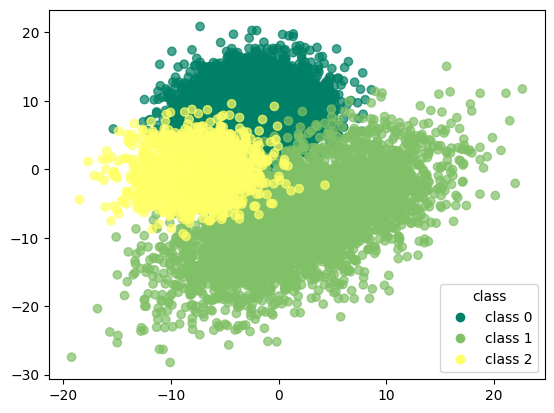

In [ ]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

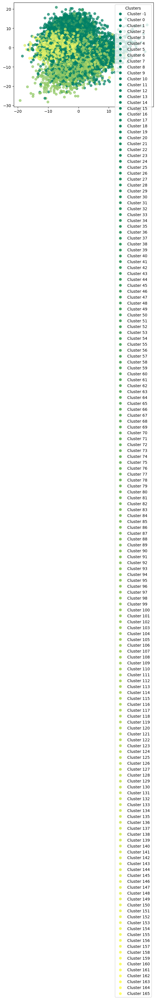

In [ ]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

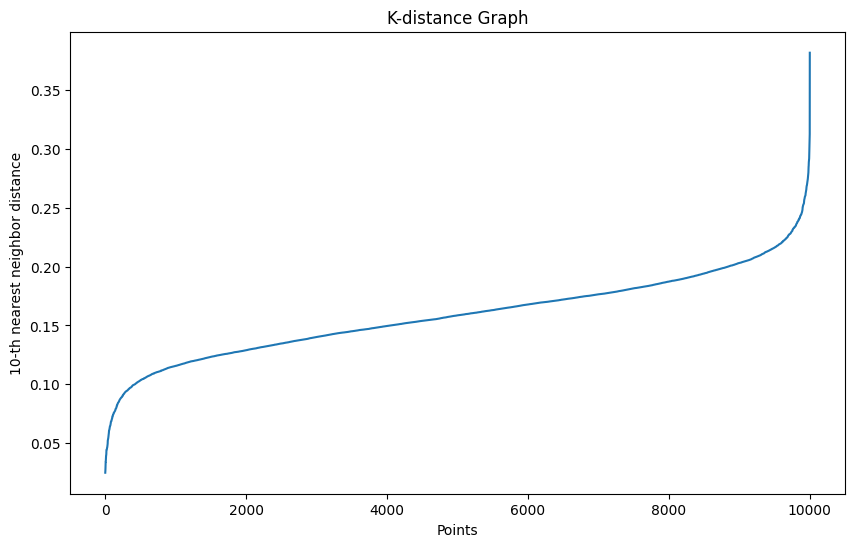

In [ ]:
plot_k_distance_graph(X_umap,k=10)

In [ ]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [ ]:
dbscan_umap.fit(X_umap)

,eps,0.6
,min_samples,10
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [ ]:
df_umap_dbscan = corr_dataset.copy()

In [ ]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [ ]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [ ]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


In [ ]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    5000
1    3500
2    1500
Name: count, dtype: int64


In [ ]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[5000    0    0]
 [   0 3500    0]
 [   0    0 1500]]


In [ ]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      1.00      1.00      3500
           2       1.00      1.00      1.00      1500

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## GMM - Gaussian Mixture Models

In [ ]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_gmm = corr_dataset.copy()

In [ ]:
df_gmm['gmm'] = gmm.predict(X_values)

In [ ]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


In [ ]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [ ]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,2


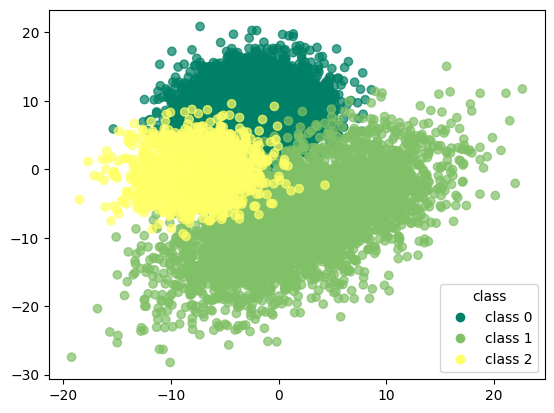

In [ ]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

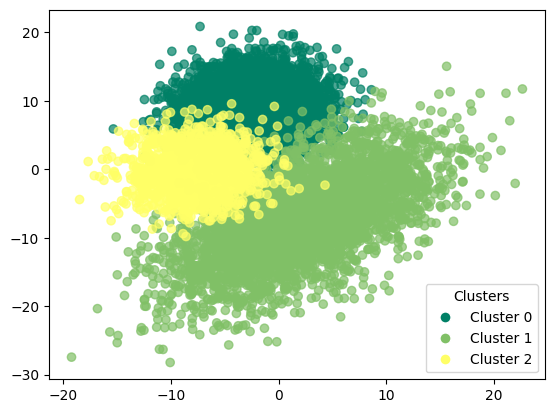

In [ ]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[5000    0    0]
 [   0 3500    0]
 [   0    0 1500]]


In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      1.00      1.00      3500
           2       1.00      1.00      1.00      1500

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



### GMM with pca

In [ ]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_pca_gmm = corr_dataset.copy()

In [ ]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [ ]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,2
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,2
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.5148
accuracy after: 0.6852


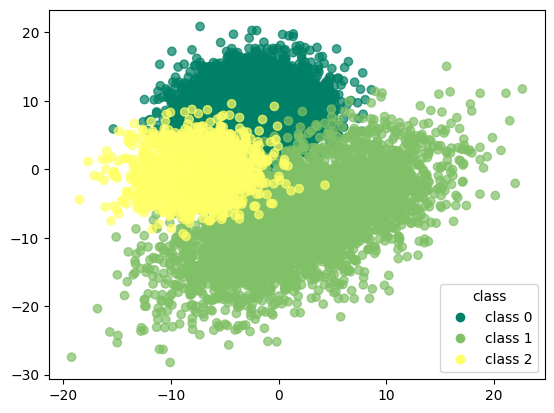

In [ ]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

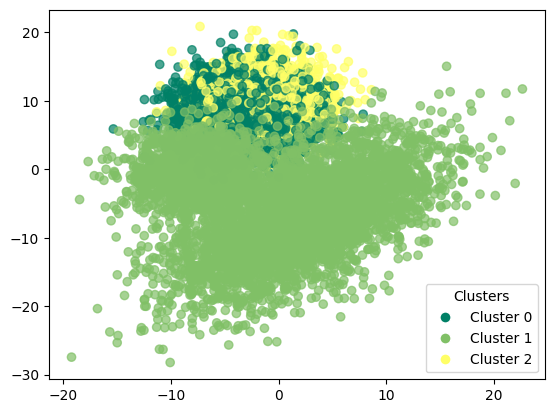

In [ ]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[3352    0 1648]
 [   0 3500    0]
 [   0 1500    0]]


In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.67      0.80      5000
           1       0.70      1.00      0.82      3500
           2       0.00      0.00      0.00      1500

    accuracy                           0.69     10000
   macro avg       0.57      0.56      0.54     10000
weighted avg       0.74      0.69      0.69     10000



### GMM with t-SNE

In [ ]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_tsne_gmm = corr_dataset.copy()

In [ ]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [ ]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,2
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.4136
accuracy after: 0.575


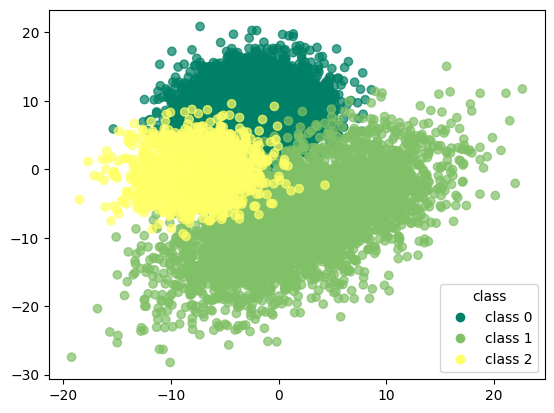

In [ ]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

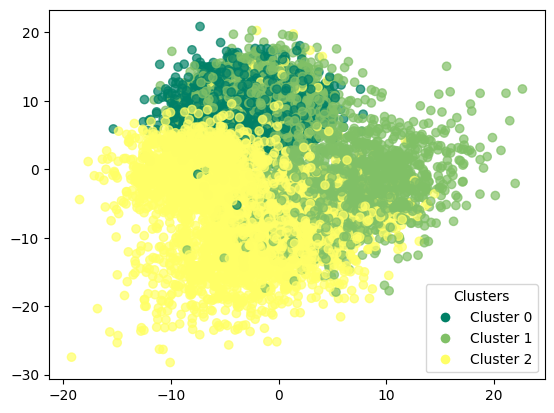

In [ ]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[2808 2078  114]
 [   0 1450 2050]
 [   8    0 1492]]


In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.56      0.72      5000
           1       0.41      0.41      0.41      3500
           2       0.41      0.99      0.58      1500

    accuracy                           0.57     10000
   macro avg       0.61      0.66      0.57     10000
weighted avg       0.70      0.57      0.59     10000



### GMM with umap

In [ ]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_umap_gmm = corr_dataset.copy()

In [ ]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [ ]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2,1
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2,1
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2,1
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2,1


In [ ]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.5
accuracy after: 1.0


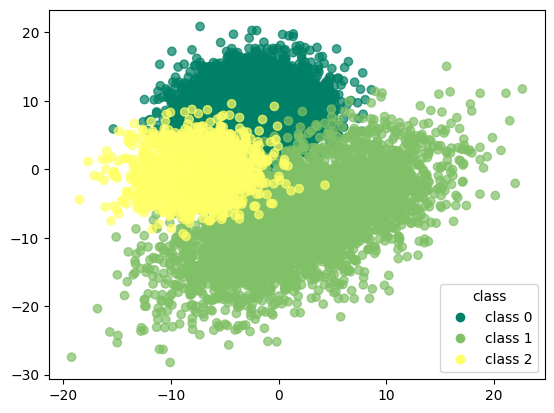

In [ ]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

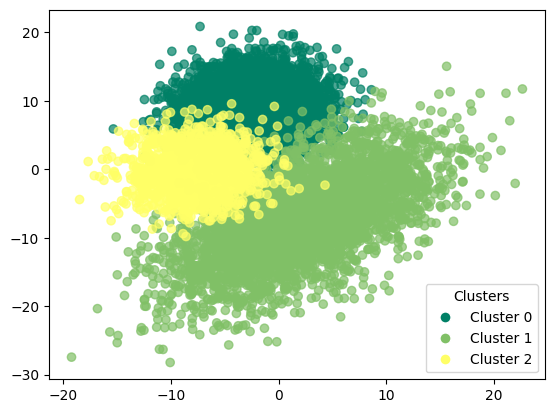

In [ ]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[5000    0    0]
 [   0 3500    0]
 [   0    0 1500]]


In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5000
           1       1.00      1.00      1.00      3500
           2       1.00      1.00      1.00      1500

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



## pam

In [ ]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [ ]:
pam.process()

In [ ]:
clusters = pam.get_clusters()

In [ ]:
medoids = pam.get_medoids()

In [ ]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam = corr_dataset.copy()

In [ ]:
df_pam['pam'] = labels

In [ ]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,1.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,1.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0.0


In [ ]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


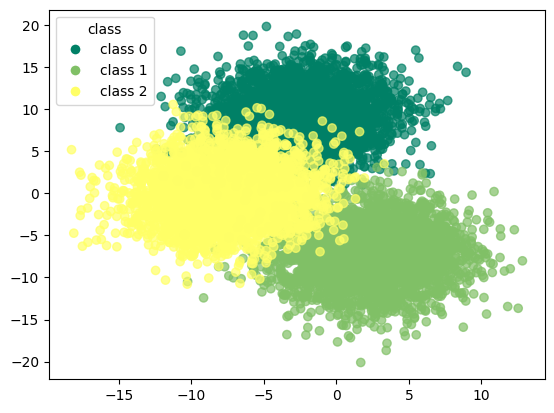

In [ ]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

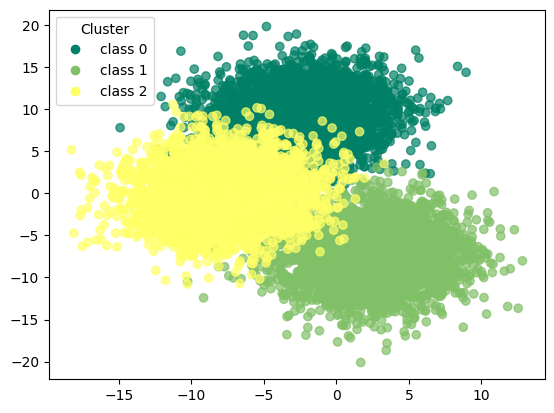

In [ ]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### pam with pca

In [ ]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [ ]:
pam_pca.process()

In [ ]:
clusters = pam_pca.get_clusters()

In [ ]:
medoids = pam_pca.get_medoids()

In [ ]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_pca = corr_dataset.copy()

In [ ]:
df_pam_pca['pam_pca'] = labels

In [ ]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1.0


In [ ]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


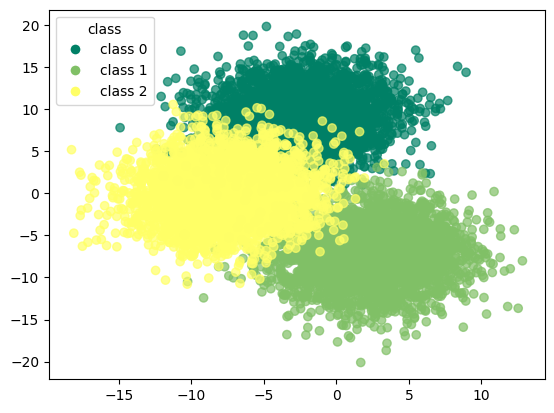

In [ ]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

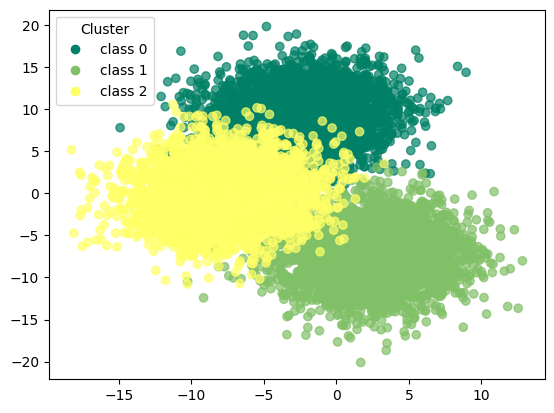

In [ ]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### pam with t-SNE

In [ ]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [ ]:
pam_tsne.process()

In [ ]:
clusters = pam_tsne.get_clusters()

In [ ]:
medoids = pam_tsne.get_medoids()

In [ ]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_tsne = corr_dataset.copy()

In [ ]:
df_pam_tsne['pam_tsne'] = labels

In [ ]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2.0


In [ ]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.9956995699569957
accuracy after: 0.9956995699569957


In [ ]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


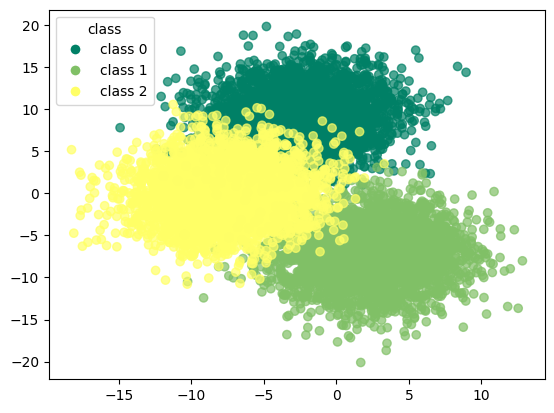

In [ ]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

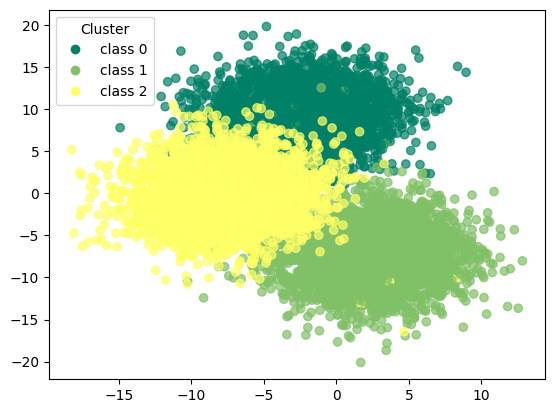

In [ ]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### pam with umap

In [ ]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [ ]:
pam_umap.process()

In [ ]:
clusters = pam_umap.get_clusters()

In [ ]:
medoids = pam_umap.get_medoids()

In [ ]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_umap = corr_dataset.copy()

In [ ]:
df_pam_umap['pam_umap'] = labels

In [ ]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,1.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,1.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0.0


In [ ]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


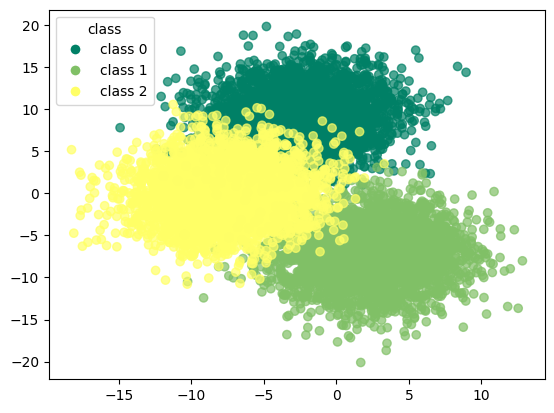

In [ ]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

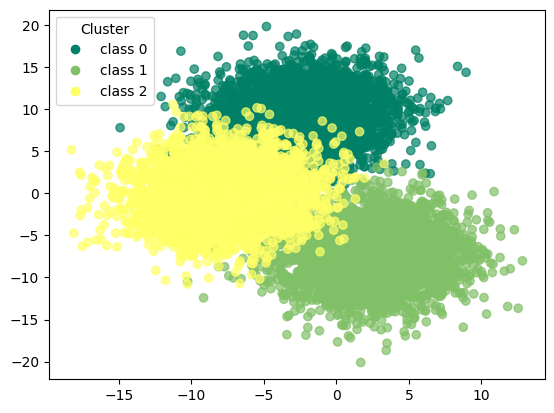

In [ ]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## spectral clustering

In [ ]:
spectral_clustering = SpectralClustering(n_clusters=3,affinity ='rbf')

In [ ]:
spectral_clustering.fit(X_values)

NameError: name 'X_values' is not defined

In [ ]:
df_spectral = corr_dataset.copy()

In [ ]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [ ]:
df_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


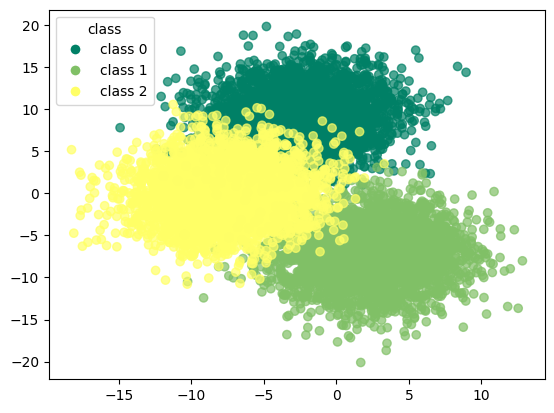

In [ ]:
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

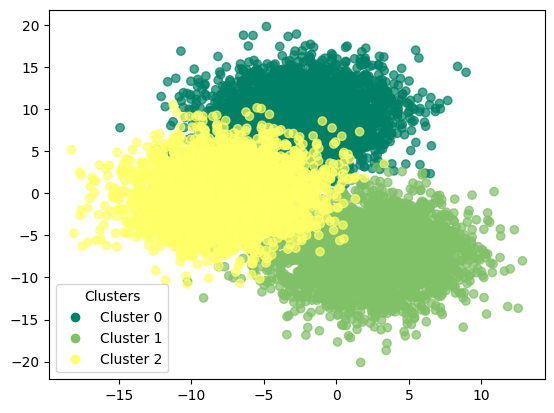

In [ ]:
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
spectral_clustering.cluster_centers_

array([[ 0.95501043, -1.05990757, -0.18467896, -0.95216698,  0.82060342,
         0.79607234,  0.05189714, -0.50953478,  0.08858066, -0.81999477,
         0.17625607, -1.24508231, -1.30255281,  0.69990828,  1.0687009 ,
         0.46686771,  0.3715359 , -0.73407159,  0.9728878 ,  0.50510369],
       [-0.97658516, -0.08581553, -0.96863943,  1.0414553 , -0.16062926,
         0.40333641,  0.64850264, -0.50748958, -0.19595987, -0.39168048,
         1.03797545,  0.3592755 ,  0.78039196,  0.57479836,  0.05462788,
         0.79002428, -0.76587601, -0.30888016, -1.10990005, -0.15924856],
       [ 0.02157473,  1.1457231 ,  1.15331839, -0.08928832, -0.65997416,
        -1.19940875, -0.70039978,  1.01702436,  0.10737921,  1.21167525,
        -1.21423152,  0.8858068 ,  0.52216084, -1.27470664, -1.12332878,
        -1.25689198,  0.39434011,  1.04295175,  0.13701225, -0.34585512]])

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### spectral clustering with pca

In [ ]:
spectral_pca = SpectralClustering(n_clusters=3,affinity=42)

In [ ]:
spectral_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_pca_spectral = corr_dataset.copy()

In [ ]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [ ]:
df_pca_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0


In [ ]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.5041504150415042


In [ ]:
df_pca_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1708    0 1625]
 [   0 3333    0]
 [   0 3333    0]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.68      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.50      9999
   macro avg       0.50      0.50      0.45      9999
weighted avg       0.50      0.50      0.45      9999



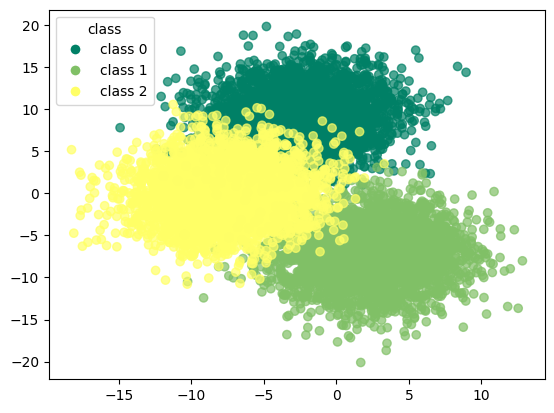

In [ ]:
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

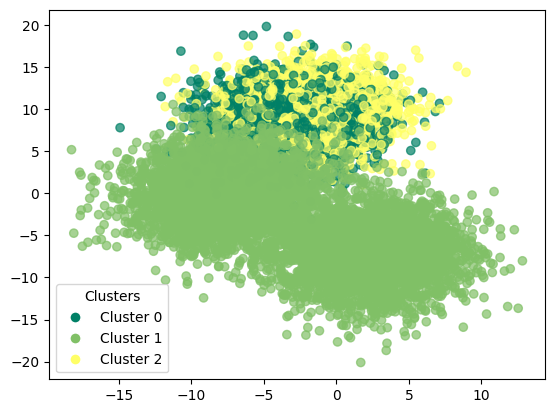

In [ ]:
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

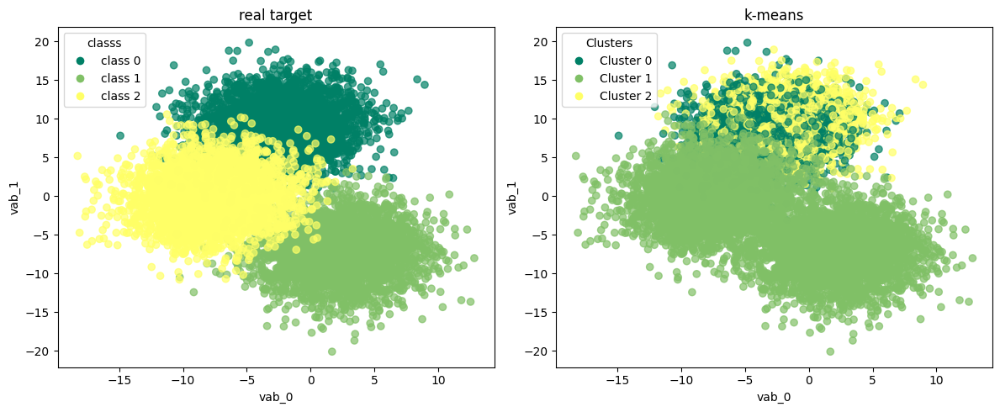

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                           c=df_pca_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_spectral['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                           c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("spectral clustering")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### spectral clustering with t-SNE

In [ ]:
spectral_tsne = SpectralClustering(n_clusters=3,affinity=42)

In [ ]:
spectral_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_tsne_spectral = corr_dataset.copy()

In [ ]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.0033003300330033004
accuracy after: 0.9964996499649965


In [ ]:
df_tsne_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


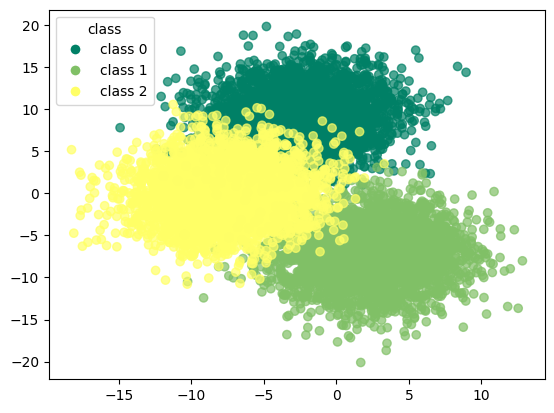

In [ ]:
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

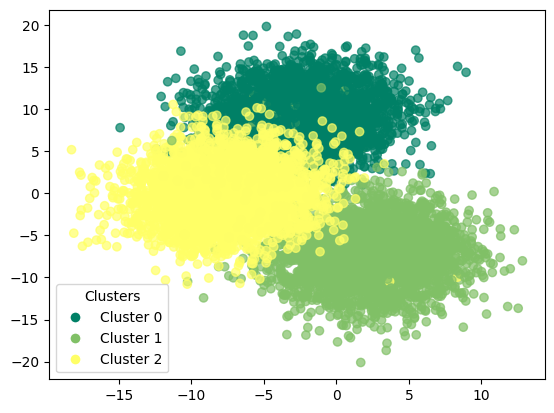

In [ ]:
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

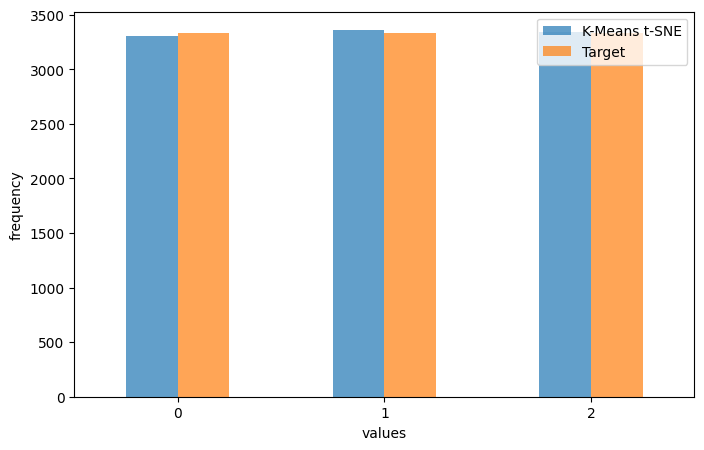

In [ ]:
counts_kmeans = df_tsne_spectral['spectral_tsne'].value_counts().sort_index()
counts_target = df_tsne_spectral['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'Spectral Clustering t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["Spectral Clustering T-sne", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### spectral clustering with umap

In [ ]:
spectral_umap = SpectralClustering(n_clusters=3,affinity=42)

In [ ]:
spectral_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_umap_spectral = corr_dataset.copy()

In [ ]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [ ]:
df_umap_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_umap_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


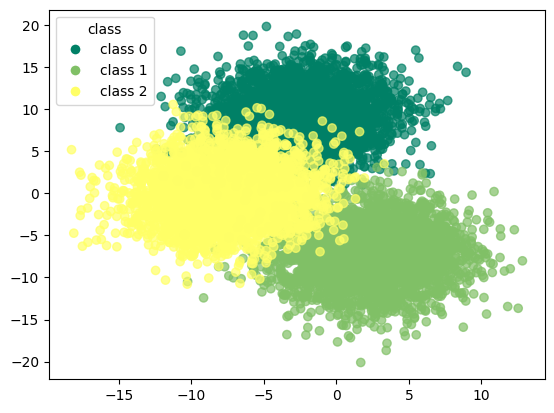

In [ ]:
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

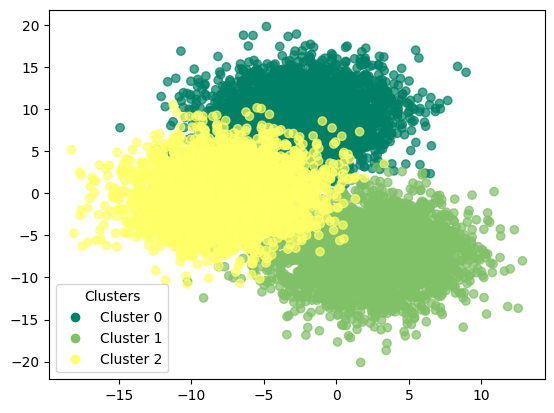

In [ ]:
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



# overall results k-means

## basic

In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


## + pca

In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.68      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.50      9999
   macro avg       0.50      0.50      0.45      9999
weighted avg       0.50      0.50      0.45      9999



In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1708    0 1625]
 [   0 3333    0]
 [   0 3333    0]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


## + UMAP

In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results trimmed k-means

## basic

In [ ]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3001
           1       1.00      1.00      1.00      2968
           2       1.00      1.00      1.00      3030

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



In [ ]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[3001    0    0]
 [   0 2968    0]
 [   0    0 3030]]


## + pca

In [ ]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95      3001
           1       0.94      0.89      0.91      2968
           2       1.00      0.95      0.97      3030

    accuracy                           0.94      8999
   macro avg       0.95      0.94      0.94      8999
weighted avg       0.95      0.94      0.94      8999



In [ ]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[3001    0    0]
 [ 331 2637    0]
 [   0  165 2865]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3001
           1       0.97      0.97      0.97      2968
           2       1.00      0.98      0.99      3030

    accuracy                           0.98      8999
   macro avg       0.98      0.98      0.98      8999
weighted avg       0.98      0.98      0.98      8999



In [ ]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[2973   27    1]
 [  77 2888    3]
 [   0   62 2968]]


## + UMAP

In [ ]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2903
           1       1.00      1.00      1.00      3102
           2       1.00      1.00      1.00      2994

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



In [ ]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[2903    0    0]
 [   0 3102    0]
 [   0    0 2994]]


# overall results dbscan

## basic

In [ ]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



In [ ]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


## + pca

In [ ]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.96      0.98      3333
           1       1.00      0.95      0.98      3333
           2       1.00      0.97      0.98      3333

    accuracy                           0.96      9999
   macro avg       0.75      0.72      0.74      9999
weighted avg       1.00      0.96      0.98      9999



In [ ]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [ 118 3215    0    0]
 [ 154    0 3179    0]
 [ 108    0    0 3225]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.04      0.08      3333
           1       0.00      0.00      0.00      3333
           2       0.00      0.00      0.00      3333
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [ ]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [1452  140  133 ...    0    0    0]
 [1379    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


## + UMAP

In [ ]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results GMM

## basic

In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


## + pca

In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.60      9999
   macro avg       0.50      0.60      0.52      9999
weighted avg       0.50      0.60      0.52      9999



In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2693    0  640]
 [   0 3333    0]
 [   0 3333    0]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           0.99      9999
   macro avg       0.99      0.99      0.99      9999
weighted avg       0.99      0.99      0.99      9999



In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[3282   44    7]
 [   0 3333    0]
 [   0    5 3328]]


## + UMAP

In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results pam

## basic

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + pca

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + t-SNE

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + umap

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



# overall results spectral clustering

## basic

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + pca

In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + t-SNE

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + umap

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999

